In [ ]:
pip install keplergl

## Project Setup

In [4]:
# all import statements needed for the project, for example:

import math

import bs4
import matplotlib.pyplot as plt
import pandas as pd
import requests
import sqlalchemy as db
import os
from sqlalchemy.orm import sessionmaker
from datetime import datetime
import numpy as np
from scipy.stats import norm
from keplergl import KeplerGl
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# any general notebook setup, like log formatting

In [5]:
# any constants you might need, for example:

TAXI_URL = "https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page"
# add other constants to refer to any local data, e.g. uber & weather
UBER_CSV = "uber_rides_sample.csv"

NEW_YORK_BOX_COORDS = ((40.560445, -74.242330), (40.908524, -73.717047))

DATABASE_URL = "sqlite:///project.db"
DATABASE_SCHEMA_FILE = "schema.sql"
QUERY_DIRECTORY = "queries"

## Part 1: Data Preprocessing

### Calculating distance

In [6]:
from typing import Tuple 
'''
calculate distance between two coordinates
input: two coordinates(tuple)
return: distance(float)
'''
def calculate_distance(from_coord:Tuple, to_coord:Tuple) -> float:
    #unzip tuples
    lon1, lat1 = from_coord
    lon2, lat2 = to_coord
    #using math.radians method to process the raw coordinates
    lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    #calculate the c by a and mutiply it by r to get the distance result
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.asin(math.sqrt(a))
    r = 6371
    return c * r

In [7]:
#unit test for calculate distance function
def test_calculate_distance():
    assert calculate_distance((1,1),(1,1)) == 0

In [8]:
'''
add distance column to the dataframe
input: dataframe
output: dataframe with distance column
'''
def add_distance_column(dataframe: pd.DataFrame)-> pd.DataFrame:
    from_coords = [(x,y) for x,y in zip(dataframe["pickup_longitude"].tolist(),dataframe["pickup_latitude"].tolist())]
    to_coords = [(x,y) for x,y in zip(dataframe["dropoff_longitude"].tolist(),dataframe["dropoff_latitude"].tolist())]
    #adding the distance column to the input dataframe by applying the calculate_distance method
    dataframe["distance"] = [calculate_distance(x,y) for x,y in zip(from_coords,to_coords)]
    return dataframe

### Processing Uber Data

In [9]:
'''
read,load and clean the uber data
input:csv_file(str)
output:processed uber data(dataframe)
'''
def load_and_clean_uber_data(csv_file:str) ->pd.DataFrame:
    #read the csv file from given string
    uber_rides = pd.read_csv('uber_rides_sample.csv')
    uber_rides = uber_rides.drop(['Unnamed: 0'], axis=1) #Remove unnecessary columns
    uber_rides = uber_rides.dropna(axis=0,how='any')
    #process the dataframe by given rules 
    uber_rides = uber_rides[(uber_rides['passenger_count'] <= 7) & (uber_rides['passenger_count'] > 0)]
    uber_rides = uber_rides[uber_rides['fare_amount'] <= 100]
    uber_rides = uber_rides[uber_rides['fare_amount'] >= 0]
    uber_rides = uber_rides[uber_rides['pickup_longitude'] != 0]
    uber_rides = uber_rides[uber_rides['pickup_latitude'] != 0]
    uber_rides = uber_rides[uber_rides['dropoff_longitude'] != 0]
    uber_rides = uber_rides[uber_rides['dropoff_latitude'] != 0]
    uber_rides = uber_rides[uber_rides['pickup_longitude'] <= -73.717047]
    uber_rides = uber_rides[uber_rides['pickup_longitude'] >= -74.242330]
    uber_rides = uber_rides[uber_rides['dropoff_longitude'] <= -73.717047]
    uber_rides = uber_rides[uber_rides['dropoff_longitude'] >= -74.242330]
    uber_rides = uber_rides[uber_rides['pickup_latitude'] <= 40.908524]
    uber_rides = uber_rides[uber_rides['pickup_latitude'] >= 40.560445]
    uber_rides = uber_rides[uber_rides['dropoff_latitude'] <= 40.908524]
    uber_rides = uber_rides[uber_rides['dropoff_latitude'] >= 40.560445]
    uber_rides['pickup_datetime'] = uber_rides['pickup_datetime'].str[:19]
    uber_rides.drop_duplicates(['key'],keep='first',inplace=True)
    return uber_rides

'''
applying the written function above and output it as a usable dataframe
input:None
output: dataframe
'''
def get_uber_data()->pd.DataFrame:
    uber_dataframe = load_and_clean_uber_data(UBER_CSV)
    uber_dataframe = add_distance_column(uber_dataframe)
    return uber_dataframe

### Processing Weather Data

In [10]:
'''
read, clean and process the month weather hourly data
input: csv_file(str)
output: dataframe
'''
def clean_month_weather_data_hourly(csv_file:str)->pd.DataFrame:
    weather_data = pd.read_csv(csv_file,low_memory=False)
    weather_data = weather_data[["DATE","LATITUDE","LONGITUDE",'HourlyPrecipitation','HourlyWindSpeed']]
    weather_data["DATES"] = weather_data["DATE"]
    del weather_data["DATE"]
    weather_data = weather_data.loc[~pd.isnull(weather_data["HourlyPrecipitation"])].replace("T",0)
    weather_data = weather_data.dropna(subset=['HourlyPrecipitation', 'HourlyWindSpeed'])
    weather_data.drop_duplicates(['DATES'],keep='first',inplace=True)
    return weather_data
    
'''
read, clean and process the month weather daily data
input: csv_file(str)
output: dataframe
''' 
def clean_month_weather_data_daily(csv_file:str)->pd.DataFrame:
    weather_data = pd.read_csv(csv_file,low_memory=False)
    weather_data = weather_data[["DATE","LATITUDE","LONGITUDE",'HourlyPrecipitation','HourlyWindSpeed','DailyAverageWindSpeed','DailyPrecipitation']]
    #weather_data = weather_data.loc[~pd.isnull(weather_data["HourlyPrecipitation"])].replace("T",0)
    weather_data = weather_data.dropna(subset=['HourlyPrecipitation', 'HourlyWindSpeed'])
    weather_data["HourlyPrecipitation"] = weather_data["HourlyPrecipitation"].replace("T",0)
    DailyAverageWindSpeed = weather_data["DailyAverageWindSpeed"].tolist()
    DailyPrecipitation = weather_data["DailyPrecipitation"].tolist()
    DATE = weather_data["DATE"].tolist()
    
    new_AverageWindSpeed = []
    new_Precipitation = []
    new_DATE = []
    LATITUDE = []
    LONGITUDE = []
    
    for idx in range(len(DailyAverageWindSpeed)):
        date = DATE[idx]
        date = date.split("T")[0]
        if date in new_DATE:
            continue
        new_DATE.append(date)
        lon = weather_data.iloc[idx]["LONGITUDE"]
        lat = weather_data.iloc[idx]["LATITUDE"]
        LATITUDE.append(lon)
        LONGITUDE.append(lat)
        
        this_day_data = weather_data.loc[weather_data["DATE"].str.startswith(date)]
        this_day_data = this_day_data.loc[(this_day_data["LONGITUDE"] == lon) & (this_day_data["LATITUDE"] == lat)]
        
        if pd.isnull(DailyAverageWindSpeed[idx]):
            x = this_day_data["HourlyWindSpeed"].tolist()
            x = [float(val) for val in x]
            new_AverageWindSpeed.append(sum(x) / len(this_day_data))
        else:
            new_AverageWindSpeed.append(DailyAverageWindSpeed[idx])
        if pd.isnull(DailyPrecipitation[idx]):
            x = this_day_data["HourlyWindSpeed"].tolist()
            x = [float(val) for val in x]
            new_Precipitation.append(sum(x))
        else:
            new_Precipitation.append(DailyPrecipitation[idx])
    #print(len(new_DATE),len(LATITUDE),len(LONGITUDE),len(new_AverageWindSpeed),len(DailyPrecipitation))
    return pd.DataFrame({
        "DATES":new_DATE,
        "LATITUDE":LATITUDE,
        "LONGITUDE":LONGITUDE,
        "DailyAverageWindSpeed":new_AverageWindSpeed,
        "DailyPrecipitation":new_Precipitation,
    })
    
'''
read, clean and process the monthly weather data
input: None
output: processed two weather dataframe(dataframe,dataframe)
'''
def load_and_clean_weather_data()->[pd.DataFrame,pd.DataFrame]:
    hourly_dataframes = []
    daily_dataframes = []
    
    # add some way to find all weather CSV files
    # or just add the name/paths manually
    weather_csv_files = ["2009_weather.csv","2010_weather.csv","2011_weather.csv","2012_weather.csv",\
                         "2013_weather.csv","2014_weather.csv","2015_weather.csv"]

    
    for csv_file in weather_csv_files:
        hourly_dataframe = clean_month_weather_data_hourly(csv_file)
        daily_dataframe = clean_month_weather_data_daily(csv_file)
        hourly_dataframes.append(hourly_dataframe)
        daily_dataframes.append(daily_dataframe)
        
    # create two dataframes with hourly & daily data from every month
    hourly_data = pd.concat(hourly_dataframes)
    daily_data = pd.concat(daily_dataframes)
    return hourly_data, daily_data

### Processing Taxi Data

In [11]:
'''
find all csv download urls from TAXI data page
input: None
return: list of csv urls
'''
def find_taxi_csv_urls()->[str,...]:
    #request the TAXI_URL
    content = requests.get(TAXI_URL)
    #read the html text by bs4
    soup = bs4.BeautifulSoup(content.text, 'html.parser')
    tags = soup('a')
    #define the download range 
    years = ['2009','2010','2011','2012','2013','2014','2015']
    montths = ['01','02','03','04','05','06','07','08','09','10','11','12']
    urls = []
    #fetch the csv urls into a list
    for tag in tags:
        href = (tag.get('href', None))
        if href.endswith(".csv") and 'yellow_tripdata_' in href:
            if any(ext in href for ext in years):
                urls.append(href)
    return urls
'''
read csv data from the url given
input: url link
return: tax dataframe
'''
def get_and_clean_month_taxi_data(url:str)->pd.DataFrame:
    df = pd.read_csv(url,skiprows=range(1,30),nrows = 2497)
    return df

'''
read csv data, concat all years dataframe into one and preprocess the dataframes into proper format
input: None
return: final taxi dataframe        
'''
def get_and_clean_taxi_data()->pd.DataFrame:
    all_taxi_dataframes = []
    
    all_csv_urls = find_taxi_csv_urls()
    for csv_url in all_csv_urls:
        #print(csv_url)
        # maybe: first try to see if you've downloaded this exact
        # file already and saved it before trying again
        dataframe = get_and_clean_month_taxi_data(csv_url)
        #add_distance_column(dataframe)
        # maybe: if the file hasn't been saved, save it so you can
        # avoid re-downloading it if you re-run the function
        
        all_taxi_dataframes.append(dataframe)
        #print(all_taxi_dataframes)
        
    # create one gigantic dataframe with data from every month needed
    df = pd.concat(all_taxi_dataframes)
    #seperated the dataframe into three different columns format dataframe 
#############################################
def process(df):
    df1 = df.loc[~df['pickup_longitude'].isnull()]
    df2 = df.loc[~df['End_Lon'].isnull()]
    df3 = df.loc[~df[' pickup_longitude'].isnull()]
    #formatted these three different format dataframes
    df1 = df1[['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
           'passenger_count', 'pickup_longitude',
           'pickup_latitude',
           'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
           'mta_tax', 'tip_amount', 'tolls_amount',
           'total_amount', 'vendor_id',
           'pickup_datetime',
           'dropoff_datetime', 'rate_code', 'surcharge']]
    df11 = df1.loc[df1['VendorID'].isnull()]
    df12 = df1.loc[~df1['VendorID'].isnull()]
    df12.drop(columns = ['vendor_id'],inplace = True)
    df12.rename(columns={"VendorID":"vendor_id"},inplace = True)
    df1 = pd.concat([df11,df12])
    df2 = df2[['mta_tax', 'surcharge', 'vendor_name',
           'Trip_Pickup_DateTime', 'Trip_Dropoff_DateTime', 'Passenger_Count',
           'Start_Lon', 'Start_Lat', 'End_Lon', 'End_Lat', 'Payment_Type', 'Fare_Amt',
           'Tip_Amt', 'Tolls_Amt', 'Total_Amt']]
    df3 = df3[['vendor_id',
           ' pickup_datetime', ' dropoff_datetime', ' passenger_count',
           ' pickup_longitude', ' pickup_latitude',
           ' dropoff_longitude', ' dropoff_latitude',
           ' payment_type', ' fare_amount', ' surcharge', ' mta_tax',
           ' tip_amount', ' tolls_amount', ' total_amount']]
    #rename the different columns name of dataframe2 and dataframe3 as same as dataframe1
    df2.rename(columns={"vendor_name":"vendor_id","Tip_Amt":"tip_amount","Start_Lon": "pickup_longitude",
                        "Start_Lat": "pickup_latitude","End_Lon":"dropoff_longitude","End_Lat":"dropoff_latitude",
                        "Passenger_Count":"passenger_count","Tolls_Amt":"tolls_amount","Total_Amt":"total_amount",
                        "Trip_Pickup_DateTime":"pickup_datetime","Trip_Dropoff_DateTime":"dropoff_datetime",
                        "Trip_Distance":"trip_distance","Payment_Type":"payment_type","Fare_Amt":"fare_amount"},inplace = True)
    df3.rename(columns={" surcharge":"surcharge"," mta_tax":"mta_tax"," tip_amount":"tip_amount", 
                        " pickup_longitude": "pickup_longitude", " pickup_latitude": "pickup_latitude",
                        " dropoff_longitude":"dropoff_longitude"," dropoff_latitude":"dropoff_latitude",
                        " passenger_count":"passenger_count"," tolls_amount":"tolls_amount"," total_amount":"total_amount",
                        " pickup_datetime":"pickup_datetime"," dropoff_datetime":"dropoff_datetime"," trip_distance":"trip_distance",
                        " payment_type":"payment_type"," fare_amount":"fare_amount"},inplace = True)
    #concat these three dataframe as one
    df_all = pd.concat([df1,df2,df3])
    #different column name of pick up time and tpe_pick time, make them as one column
    df_11 = df_all[~df_all['tpep_pickup_datetime'].isnull()]
    df_22 = df_all[~df_all['pickup_datetime'].isnull()]
    df_11.drop(columns = ["pickup_datetime","dropoff_datetime"],inplace = True)
    df_11.rename(columns = {"tpep_pickup_datetime":"pickup_datetime","tpep_dropoff_datetime":"dropoff_datetime"},inplace = True)
    df_final = pd.concat([df_22,df_11])
    df_final.drop(columns = ["tpep_pickup_datetime","tpep_dropoff_datetime",'VendorID'],inplace = True)
    #because some of the data points only has one of longitude or latitude data 
    #so replace nan with 0 so that we can still calculate the distance instead of missing.
    df_final['pickup_longitude'] = df_final['pickup_longitude'].replace(float('nan'), 0)
    df_final['pickup_latitude'] = df_final['pickup_latitude'].replace(float('nan'), 0)
    df_final['dropoff_longitude'] = df_final['dropoff_longitude'].replace(float('nan'), 0)
    df_final['dropoff_latitude'] = df_final['dropoff_latitude'].replace(float('nan'), 0)
    #add distance column to the dataframe
    add_distance_column(df_final)
    df_final = df_final[['vendor_id','total_amount','tip_amount','distance','passenger_count','pickup_datetime','dropoff_datetime']]
    return df_final

### Process All Data

In [12]:
uber_data = get_uber_data()
hourly_weather, daily_weather = load_and_clean_weather_data()
#taxi_data = get_and_clean_taxi_data()

In [13]:
data = pd.read_csv('output.csv')
taxi_data = process(data)

In [20]:
uber_data

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
0,2015-05-07 19:52:06.0000003,7.5,2015-05-07 19:52:06,-73.999817,40.738354,-73.999512,40.723217,1,1.683323
1,2009-07-17 20:04:56.0000002,7.7,2009-07-17 20:04:56,-73.994355,40.728225,-73.994710,40.750325,1,2.457590
2,2009-08-24 21:45:00.00000061,12.9,2009-08-24 21:45:00,-74.005043,40.740770,-73.962565,40.772647,1,5.036377
3,2009-06-26 08:22:21.0000001,5.3,2009-06-26 08:22:21,-73.976124,40.790844,-73.965316,40.803349,3,1.661683
4,2014-08-28 17:47:00.000000188,16.0,2014-08-28 17:47:00,-73.925023,40.744085,-73.973082,40.761247,5,4.475450
...,...,...,...,...,...,...,...,...,...
199995,2012-10-28 10:49:00.00000053,3.0,2012-10-28 10:49:00,-73.987042,40.739367,-73.986525,40.740297,1,0.112210
199996,2014-03-14 01:09:00.0000008,7.5,2014-03-14 01:09:00,-73.984722,40.736837,-74.006672,40.739620,1,1.875050
199997,2009-06-29 00:42:00.00000078,30.9,2009-06-29 00:42:00,-73.986017,40.756487,-73.858957,40.692588,2,12.850319
199998,2015-05-20 14:56:25.0000004,14.5,2015-05-20 14:56:25,-73.997124,40.725452,-73.983215,40.695415,1,3.539715


In [21]:
hourly_weather

,LATITUDE,LONGITUDE,HourlyPrecipitation,HourlyWindSpeed,DATES
36,40.77898,-73.96925,0,14.0,2009-01-02T12:34:00
37,40.77898,-73.96925,0,11.0,2009-01-02T12:51:00
38,40.77898,-73.96925,0,7.0,2009-01-02T13:05:00
39,40.77898,-73.96925,0,9.0,2009-01-02T13:30:00
40,40.77898,-73.96925,0,10.0,2009-01-02T13:46:00
...,...,...,...,...,...
11379,40.77898,-73.96925,0.00,3.0,2015-12-31T18:51:00
11380,40.77898,-73.96925,0.00,6.0,2015-12-31T19:51:00
11381,40.77898,-73.96925,0.00,10.0,2015-12-31T20:51:00
11383,40.77898,-73.96925,0.00,7.0,2015-12-31T22:51:00


In [22]:
daily_weather

,DATES,LATITUDE,LONGITUDE,DailyAverageWindSpeed,DailyPrecipitation
0,2009-01-02,-73.96925,40.77898,9.111111,82.0
1,2009-01-03,-73.96925,40.77898,8.000000,8.0
2,2009-01-05,-73.96925,40.77898,9.000000,9.0
3,2009-01-06,-73.96925,40.77898,9.100000,91.0
4,2009-01-07,-73.96925,40.77898,10.057143,352.0
...,...,...,...,...,...
357,2015-12-27,-73.96925,40.77898,5.666667,136.0
358,2015-12-28,-73.96925,40.77898,8.130435,187.0
359,2015-12-29,-73.96925,40.77898,7.868421,299.0
360,2015-12-30,-73.96925,40.77898,4.035714,113.0


In [21]:
taxi_data

,vendor_id,total_amount,tip_amount,distance,passenger_count,pickup_datetime,dropoff_datetime
59928,CMT,36.30,0.00,10.081760,2.0,2013-01-01 14:02:01,2013-01-01 14:27:39
59929,CMT,8.00,0.00,1.200742,1.0,2013-01-05 11:54:49,2013-01-05 12:03:48
59930,CMT,20.50,0.00,8.285639,1.0,2013-01-05 08:16:58,2013-01-05 08:30:20
59931,CMT,10.50,0.00,4.201930,1.0,2013-01-05 19:04:43,2013-01-05 19:13:58
59932,CMT,18.50,0.00,5.988665,1.0,2013-01-05 17:34:11,2013-01-05 17:48:54
...,...,...,...,...,...,...,...
29959,1.0,17.30,0.00,4.769507,1.0,2015-12-04 17:25:18,2015-12-04 17:47:24
29960,1.0,6.80,0.00,0.881707,2.0,2015-12-04 17:25:18,2015-12-04 17:29:10
29961,2.0,10.30,0.00,2.025020,1.0,2015-12-04 17:25:18,2015-12-04 17:35:14
29962,2.0,25.56,4.26,2.900216,1.0,2015-12-04 17:25:18,2015-12-04 17:57:58


## Part 2: Storing Cleaned Data

In [14]:
engine = db.create_engine(DATABASE_URL)

In [24]:
# if using SQL (as opposed to SQLAlchemy), define the commands 
# to create your 4 tables/dataframes
HOURLY_WEATHER_SCHEMA = """
CREATE TABLE IF NOT EXISTS HOURLY_WEATHER (
   DATES DATETIME PRIMARY KEY,
   LATITUDE FLOAT,
   LONGITUDE FLOAT,
   HourlyPrecipitation FLOAT,
   HourlyWindSpeed FLOAT
);
"""

DAILY_WEATHER_SCHEMA = """
CREATE TABLE IF NOT EXISTS DAILY_WEATHER (
   DATES DATETIME PRIMARY KEY,
   LATITUDE FLOAT,
   LONGITUDE FLOAT,
   DailyAverageWindSpeed FLOAT,
   DailyPrecipitation FLOAT
);
"""
#need to make sure it is datetime or text and there is two distance in this file
TAXI_TRIPS_SCHEMA = """
CREATE TABLE IF NOT EXISTS TAXI_TRIPS (
   record_id INTEGER PRIMARY KEY AUTOINCREMENT ,
   vendor_id TEXT,
   tip_amount FLOAT,
   total_amount FLOAT,
   distance FLOAT,
   passenger_count INTEGER,
   pickup_datetime DATETIME,
   dropoff_datetime DATETIME
);
"""

UBER_TRIPS_SCHEMA = """
CREATE TABLE IF NOT EXISTS UBER_TRIPS (
   ecord_id INTEGER PRIMARY KEY AUTOINCREMENT,
   key TEXT,
   pickup_longitude FLOAT,
   pickup_latitude FLOAT,
   dropoff_longitude FLOAT,
   dropoff_latitude FLOAT,
   fare_amount FLOAT,
   distance FLOAT,
   passenger_count INTEGER,
   pickup_datetime DATETIME
)
"""

In [25]:
# create that required schema.sql file
with open(DATABASE_SCHEMA_FILE, "w") as f:
    f.write(HOURLY_WEATHER_SCHEMA)
    f.write(DAILY_WEATHER_SCHEMA)
    f.write(TAXI_TRIPS_SCHEMA)
    f.write(UBER_TRIPS_SCHEMA)

In [26]:
# create the tables with the schema files
with engine.connect() as connection:
    commands = open(DATABASE_SCHEMA_FILE, "r").read().split(";")
    for command in commands:
        engine.execute(command)

In [23]:
engine.execute("drop table UBER_TRIPS")
engine.execute("drop table TAXI_TRIPS")
engine.execute("drop table HOURLY_WEATHER")
engine.execute("drop table DAILY_WEATHER")

### Add Data to Database

In [27]:
'''
write the datafame into the defined sql table
input: table_name_to_dataframe(dict)
output:None
'''
def dataframes_to_table(table_name_to_dataframe: dict)->None:
    for table,dataframe in table_name_to_dataframe.items():
        pd.io.sql.to_sql(dataframe, table, con = engine, index = False, if_exists = 'append')

In [28]:
table_name_to_dataframe = {
    "taxi_trips": taxi_data,
    "uber_trips": uber_data,
    "hourly_weather": hourly_weather,
    "daily_weather": daily_weather,
}

dataframes_to_table(table_name_to_dataframe)

## Part 3: Understanding the Data

In [29]:
'''
write the query string into sql file with outfile as its file name:
input: query(str), output(str)
output: None
'''
def write_query_to_file(query:str, outfile:str)->None:
    with open(outfile, "w") as f:
        f.write(query)

### Query N

In [30]:
QUERY_1 = """
select strftime('%H', pickup_datetime) as hours, COUNT(*) as counts from TAXI_TRIPS where pickup_datetime between '2009-01-01' and '2015-06-30' group by strftime('%H', pickup_datetime)
"""

QUERY_2 = """
select strftime('%w', pickup_datetime) as Days, COUNT(*) as counts from UBER_TRIPS where pickup_datetime between '2009-01-01' and '2015-06-30' group by strftime('%w', pickup_datetime)
"""

QUERY_3 = """
WITH p AS (SELECT distance, NTILE(100) OVER (ORDER BY distance) AS percentile
           FROM UBER_TRIPS
           WHERE pickup_datetime between '2013-07-01' and '2013-07-31')
SELECT percentile, MAX(distance) as distance
FROM p
where percentile = 95
GROUP BY percentile;
"""
QUERY_4 = """
with p as (
select DATE(pickup_datetime) as nth_day_2009, avg(distance) as avg_distance
from UBER_TRIPS
where pickup_datetime between '2009-01-01' and '2009-12-31'
group by DATE(pickup_datetime)
order by avg(distance))
select * 
from p
limit 10
"""
QUERY_5 = """
with p as (select DATES, row_number() Over(order by DailyAverageWindSpeed desc) as rank
from DAILY_WEATHER
where DATES between '2014-01-01' and '2014-12-31'
order by rank 
limit 10),
u as(
select DATE(pickup_datetime) as date, count(*) as count
from UBER_TRIPS
where pickup_datetime between '2014-01-01' and '2014-12-31'
group by DATE(pickup_datetime)
)

select p.DATES, u.count
from p
inner join 
u
on p.DATES = u.date

"""

QUERY_6 = """
with h as (
select strftime('%Y %m %d %H', DATES) as hour, count(*) as count, HourlyWindSpeed 
from HOURLY_WEATHER
where LONGITUDE <= -73.717047  and 
      LONGITUDE >= -74.242330  and 
      LATITUDE <= 40.908524    and 
      LATITUDE >= 40.560445    and
      DATES between '2012-10-23' and '2012-10-30' 
group by strftime('%Y %m %d %H', DATES)),
u as (
select strftime('%Y %m %d %H', pickup_datetime) as hour, count(*) as count
from UBER_TRIPS
where pickup_datetime between '2012-10-23' and '2012-10-30'
group by strftime('%Y %m %d %H', pickup_datetime)
)

select h.hour as time ,h.count as precipitation,h.HourlyWindSpeed as HourlyWindSpeed,u.count as trips_count
from h
inner join u
on h.hour = u.hour
"""

In [31]:
#For 01-2009 through 06-2015, what hour of the day was the most popular to take a Yellow Taxi
engine.execute(QUERY_1).fetchall()

[('00', 8350),
 ('01', 5403),
 ('02', 4733),
 ('03', 3028),
 ('04', 2269),
 ('05', 2120),
 ('06', 4281),
 ('07', 6391),
 ('08', 8291),
 ('09', 8712),
 ('10', 8358),
 ('11', 11706),
 ('12', 10213),
 ('13', 9095),
 ('14', 9404),
 ('15', 8962),
 ('16', 7644),
 ('17', 8665),
 ('18', 10857),
 ('19', 10703),
 ('20', 11421),
 ('21', 12238),
 ('22', 11289),
 ('23', 10633)]

In [32]:
#For the same time frame, what day of the week was the most popular to take an Uber
engine.execute(QUERY_2).fetchall()

[('0', 25757),
 ('1', 24562),
 ('2', 27345),
 ('3', 28223),
 ('4', 29239),
 ('5', 30061),
 ('6', 29489)]

In [33]:
#What is the 95% percentile of distance traveled for all hired trips during July 2013
engine.execute(QUERY_3).fetchall()

[(95, 10.453778132892621)]

In [34]:
#What were the top 10 days with the highest number of hired rides for 2009, and what was the average distance for each day?
engine.execute(QUERY_4).fetchall()

[('2009-11-18', 2.228771698629074),
 ('2009-12-17', 2.2300719177020096),
 ('2009-02-28', 2.271575274069881),
 ('2009-01-20', 2.3763295352736877),
 ('2009-08-06', 2.39577626203583),
 ('2009-01-21', 2.3966410036609056),
 ('2009-01-24', 2.3998907469041937),
 ('2009-10-23', 2.4524671315099393),
 ('2009-10-20', 2.4658786602115796),
 ('2009-10-07', 2.4712013826779553)]

In [35]:
#Which 10 days in 2014 were the windiest on average, and how many hired trips were made on those days?
engine.execute(QUERY_5).fetchall()

[('2014-01-02', 63),
 ('2014-01-07', 77),
 ('2014-02-13', 63),
 ('2014-03-13', 106),
 ('2014-03-26', 96),
 ('2014-03-29', 107),
 ('2014-11-02', 80),
 ('2014-12-07', 73),
 ('2014-12-08', 77),
 ('2014-12-09', 70)]

In [38]:
#During Hurricane Sandy in NYC (Oct 29-30, 2012), plus the week leading up and the week after, how many trips were taken each hour, and for each hour, how much precipitation did NYC receive and what was the sustained wind speed
#the header of the result shoudl be (time,precipitation,HourlyWindSpeed,trips_count)
engine.execute(QUERY_6).fetchall()

[('2012 10 23 12', 1, 0.0, 1),
 ('2012 10 23 19', 1, 0.0, 2),
 ('2012 10 23 20', 1, 0.0, 8),
 ('2012 10 23 21', 1, 5.0, 4),
 ('2012 10 23 22', 1, 0.0, 6),
 ('2012 10 23 23', 1, 5.0, 3),
 ('2012 10 24 02', 1, 5.0, 4),
 ('2012 10 24 05', 1, 6.0, 2),
 ('2012 10 24 07', 1, 0.0, 1),
 ('2012 10 24 08', 1, 0.0, 2),
 ('2012 10 24 09', 1, 3.0, 4),
 ('2012 10 24 10', 1, 7.0, 2),
 ('2012 10 24 11', 1, 7.0, 4),
 ('2012 10 24 12', 2, 7.0, 3),
 ('2012 10 24 13', 1, 8.0, 4),
 ('2012 10 24 14', 1, 7.0, 2),
 ('2012 10 24 15', 1, 7.0, 4),
 ('2012 10 24 16', 1, 8.0, 2),
 ('2012 10 24 17', 1, 5.0, 5),
 ('2012 10 24 18', 1, 7.0, 4),
 ('2012 10 24 19', 1, 8.0, 5),
 ('2012 10 24 20', 1, 3.0, 7),
 ('2012 10 24 21', 1, 5.0, 7),
 ('2012 10 24 22', 1, 6.0, 5),
 ('2012 10 24 23', 1, 0.0, 3),
 ('2012 10 25 00', 1, 3.0, 5),
 ('2012 10 25 01', 1, 3.0, 1),
 ('2012 10 25 02', 1, 3.0, 2),
 ('2012 10 25 04', 1, 6.0, 1),
 ('2012 10 25 05', 1, 0.0, 2),
 ('2012 10 25 06', 1, 5.0, 4),
 ('2012 10 25 07', 1, 6.0, 3),
 ('2012 

In [34]:
#write all query to sql file by given file name
write_query_to_file(QUERY_1, "yellow_taxi_most_popular.sql")
write_query_to_file(QUERY_2, "uber_most_popular.sql")
write_query_to_file(QUERY_3, "95percentile_distance_july_2013.sql")
write_query_to_file(QUERY_4, "top10_2009_and_avg.sql")
write_query_to_file(QUERY_5, "top10_windiest.sql")
write_query_to_file(QUERY_6, "hurricane.sql")

## Part 4: Visualizing the Data

### Visualization N

Call from database

In [35]:
engine = db.create_engine(DATABASE_URL)

In [36]:
yellow_taxi = pd.read_sql_query('select * from "TAXI_TRIPS"',con=engine)
uber = pd.read_sql_query('select * from "UBER_TRIPS"',con=engine)
hourly_weather = pd.read_sql_query('select * from "HOURLY_WEATHER"',con=engine)
daily_weather = pd.read_sql_query('select * from "DAILY_WEATHER"',con=engine)

In [37]:
yellow_taxi["pickup_datetime"] = pd.to_datetime(yellow_taxi["pickup_datetime"])
yellow_taxi["dropoff_datetime"] = pd.to_datetime(yellow_taxi["dropoff_datetime"])
yellow_taxi

,vendor_id,total_amount,tip_amount,distance,passenger_count,pickup_datetime,dropoff_datetime
0,CMT,36.30,0.00,10.081760,2.0,2013-01-01 14:02:01,2013-01-01 14:27:39
1,CMT,8.00,0.00,1.200742,1.0,2013-01-05 11:54:49,2013-01-05 12:03:48
2,CMT,20.50,0.00,8.285639,1.0,2013-01-05 08:16:58,2013-01-05 08:30:20
3,CMT,10.50,0.00,4.201930,1.0,2013-01-05 19:04:43,2013-01-05 19:13:58
4,CMT,18.50,0.00,5.988665,1.0,2013-01-05 17:34:11,2013-01-05 17:48:54
...,...,...,...,...,...,...,...
209743,1.0,17.30,0.00,4.769507,1.0,2015-12-04 17:25:18,2015-12-04 17:47:24
209744,1.0,6.80,0.00,0.881707,2.0,2015-12-04 17:25:18,2015-12-04 17:29:10
209745,2.0,10.30,0.00,2.025020,1.0,2015-12-04 17:25:18,2015-12-04 17:35:14
209746,2.0,25.56,4.26,2.900216,1.0,2015-12-04 17:25:18,2015-12-04 17:57:58


In [38]:
uber["pickup_datetime"] = pd.to_datetime(uber["pickup_datetime"])
uber

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
0,2015-05-07 19:52:06.0000003,7.5,2015-05-07 19:52:06,-73.999817,40.738354,-73.999512,40.723217,1,1.683323
1,2009-07-17 20:04:56.0000002,7.7,2009-07-17 20:04:56,-73.994355,40.728225,-73.994710,40.750325,1,2.457590
2,2009-08-24 21:45:00.00000061,12.9,2009-08-24 21:45:00,-74.005043,40.740770,-73.962565,40.772647,1,5.036377
3,2009-06-26 08:22:21.0000001,5.3,2009-06-26 08:22:21,-73.976124,40.790844,-73.965316,40.803349,3,1.661683
4,2014-08-28 17:47:00.000000188,16.0,2014-08-28 17:47:00,-73.925023,40.744085,-73.973082,40.761247,5,4.475450
...,...,...,...,...,...,...,...,...,...
194735,2012-10-28 10:49:00.00000053,3.0,2012-10-28 10:49:00,-73.987042,40.739367,-73.986525,40.740297,1,0.112210
194736,2014-03-14 01:09:00.0000008,7.5,2014-03-14 01:09:00,-73.984722,40.736837,-74.006672,40.739620,1,1.875050
194737,2009-06-29 00:42:00.00000078,30.9,2009-06-29 00:42:00,-73.986017,40.756487,-73.858957,40.692588,2,12.850319
194738,2015-05-20 14:56:25.0000004,14.5,2015-05-20 14:56:25,-73.997124,40.725452,-73.983215,40.695415,1,3.539715


In [39]:
daily_weather["DATES"] =  pd.to_datetime(daily_weather["DATES"])
daily_weather

,DATES,LATITUDE,LONGITUDE,DailyAverageWindSpeed,DailyPrecipitation
0,2009-01-02,-73.96925,40.77898,9.111111,82.0
1,2009-01-03,-73.96925,40.77898,8.000000,8.0
2,2009-01-05,-73.96925,40.77898,9.000000,9.0
3,2009-01-06,-73.96925,40.77898,9.100000,91.0
4,2009-01-07,-73.96925,40.77898,10.057143,352.0
...,...,...,...,...,...
1746,2015-12-27,-73.96925,40.77898,5.666667,136.0
1747,2015-12-28,-73.96925,40.77898,8.130435,187.0
1748,2015-12-29,-73.96925,40.77898,7.868421,299.0
1749,2015-12-30,-73.96925,40.77898,4.035714,113.0


### 1.	Create an appropriate visualization for the first query/question in part 3.

Count the order quantity by hour;

Draw a bar chart: x-axis: hour, y-axis: quantity.

In [40]:
def plot_q1(yellow_taxi):
    start_date = pd.to_datetime('20050101')
    end_date = pd.to_datetime('20150630')
    filtered_yellow_taxi = yellow_taxi[ start_date <= yellow_taxi["pickup_datetime"]]
    filtered_yellow_taxi = filtered_yellow_taxi[ yellow_taxi["pickup_datetime"]  <= end_date]
    filtered_yellow_taxi["pickup_datetime"] = [x.hour for x in filtered_yellow_taxi["pickup_datetime"]]
    hours = [i for i in range(1,25)]
    cnt = [filtered_yellow_taxi["pickup_datetime"].tolist().count(hour) for hour in hours]
    hours = [str(x) for x in hours]
    plt.bar(hours,cnt)
    plt.xlabel("Hour")
    plt.ylabel("Count")
    plt.title("Count of Yellow Taxi Orders per Hour.")
    plt.show()
    return

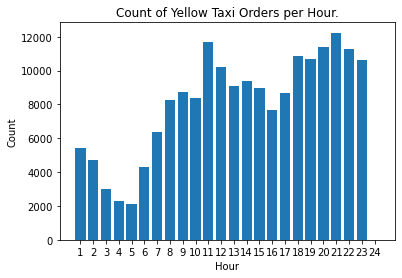

In [41]:
plot_q1(yellow_taxi)

### 2.	Create a visualization that shows the average distance traveled per month (regardless of year - so group by each month) for both taxis and Ubers combined. Include the 90% confidence interval around the mean in the visualization.

Classify the data by month;

Draw the bar chart according to the average distance of each category

In [62]:
def plot_q2(uber,yellow_taxi):
    filtered_yellow_taxi = yellow_taxi.copy()
    filtered_uber = uber.copy()
    filtered_yellow_taxi["pickup_datetime_month"] = [x.month for x in yellow_taxi["pickup_datetime"]]
    filtered_uber["pickup_datetime_month"] = [x.month for x in uber["pickup_datetime"]]
    months = [i for i in range(1,13)]
    taxi_avgs = [ filtered_yellow_taxi[filtered_yellow_taxi["pickup_datetime_month"] == month]["distance"].mean() for month in months]
    uber_avgs = [ filtered_uber[filtered_uber["pickup_datetime_month"] == month]["distance"].mean() for month in months]
    taxi_avgs = [0 if pd.isnull(x) else x for x in taxi_avgs]
    uber_avgs = [0 if pd.isnull(x) else x for x in uber_avgs]

    taxi_avgs = [0, 2.6193855199999634, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
    bar_width=0.35

    taxi_std = [ filtered_yellow_taxi[filtered_yellow_taxi["pickup_datetime_month"] == month]["distance"].std() for month in months]
    uber_std = [ filtered_uber.loc[filtered_uber["pickup_datetime_month"] == month]["distance"].std() for month in months]
    
    taxi_std = [0, 2.9821261836258737,0, 0, 0, 0, 0, 0, 0, 0, 0,0]
    plt.bar(months,taxi_avgs,bar_width,color="c",align="center",label="yellow taxi",alpha=0.5,yerr=taxi_std)
    plt.bar(np.array(months)+bar_width,uber_avgs,bar_width,color="b",align="center",label="uber",alpha=0.5,yerr=uber_std)
    plt.legend()
    plt.xlabel("Month")
    plt.ylabel("Count")
    plt.title("Count of Yellow Taxi and Uber Orders per Month.")
    plt.show()
    return

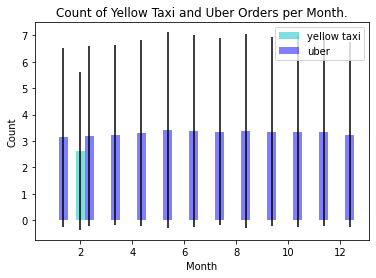

In [63]:
plot_q2(uber,yellow_taxi)

### 3. Define three lat/long coordinate boxes around the three major New York airports: LGA, JFK, and EWR (you can use bboxfinder to help). Create a visualization that compares what day of the week was most popular for drop offs for each airport.

Select data for the three airports according to the coordinate boxes;

Counted by month;

Draw pie chart.

In [74]:
JFK = (40.617253,286.179099 - 360,40.676618,286.258776 - 360) 
EWR = (40.671528,285.801969 - 360,40.710298,285.852798 - 360)
LGA = (40.763423,286.106205 - 360,40.784148,286.144842 - 360)
labels = ["Mon.","Tue.","Wed.","Thur.","Fri.","Sat.","Sun."]


def within(lat,lon,box):
    lat1,lon1,lat2,lon2 = box
    return lat1 <= lat <= lat2 and lon1 <= lon <= lon2

def plot_q3(uber):
    new_uber = uber.copy()
    new_uber["JFK"] = [within(lat,lon,JFK) for lat,lon in zip(new_uber["dropoff_latitude"],new_uber["dropoff_longitude"])]
    new_uber["EWR"] = [within(lat,lon,EWR) for lat,lon in zip(new_uber["dropoff_latitude"],new_uber["dropoff_longitude"])]
    new_uber["LGA"] = [within(lat,lon,LGA) for lat,lon in zip(new_uber["dropoff_latitude"],new_uber["dropoff_longitude"])]
    new_uber["day"] = [x.dayofweek for x in new_uber["pickup_datetime"]]
    plt.figure(figsize=(18,6))
    plt.subplot(1,3,1)
    JFKdata = new_uber.loc[new_uber["JFK"]]
    JFKdata = [len(JFKdata.loc[JFKdata["day"] == i]) for i in range(7)]
    plt.pie(JFKdata,labels = labels,autopct='%.2f%%')
    plt.title("JFK")
    plt.subplot(1,3,2)
    EWRdata = new_uber.loc[new_uber["EWR"]]
    EWRdata = [len(EWRdata.loc[EWRdata["day"] == i]) for i in range(7)]
    plt.pie(EWRdata,labels = labels,autopct='%.2f%%')
    plt.title("EWR")
    plt.subplot(1,3,3)
    LGAdata = new_uber.loc[new_uber["LGA"]]
    LGAdata = [len(LGAdata.loc[LGAdata["day"] == i]) for i in range(7)]
    plt.pie(LGAdata,labels = labels,autopct='%.2f%%')
    plt.title("LGA")
    plt.suptitle("Pie Figure for Day of the week for the Drop offs for Each Airport.")
    plt.show()
    return

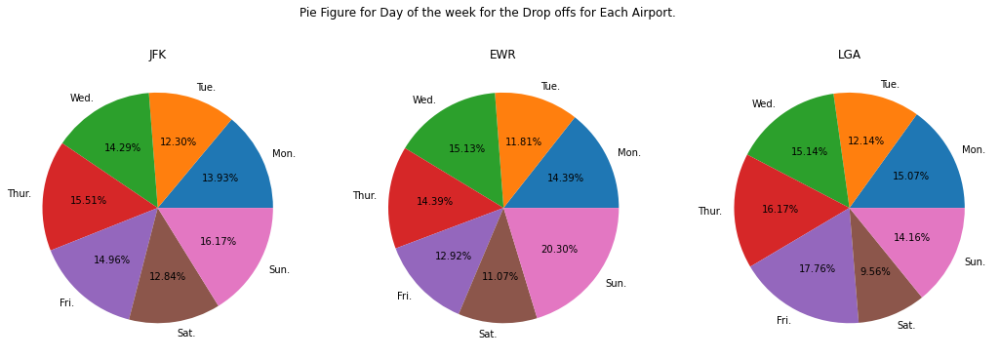

In [75]:
plot_q3(uber)

### 4. Create a heatmap of all hired trips over a map of the area. Consider using KeplerGL or another library that helps generate geospatial visualizations.

Use the KeplerGL library to add latitude and longitude coordinates to the map;

Convert them into a HeatMap in the options Settings.

In [76]:
def plot_q4(uber):
    map_1 = KeplerGl(height=500)
    uber_location = pd.DataFrame()
    uber_location["Latitude"] = uber["pickup_latitude"]
    uber_location["Longitude"] = uber["pickup_longitude"]
    map_1.add_data(data=uber_location, name='hired trips')
    return map_1

In [77]:
plot_q4(uber)

NameError: name 'KeplerGl' is not defined

### 5. Create a scatter plot that compares tip amount versus distance for Yellow Taxi rides. You may remove any outliers how you see fit.

Draw a scatter plot, x-axis = Trip Distance and y-axis = Tip Amount.

In [70]:
def plot_q5(yellow_taxi):
    filtered_yellow_taxi = yellow_taxi[["distance","tip_amount"]].sample(10000)
    filtered_yellow_taxi = filtered_yellow_taxi.loc[filtered_yellow_taxi["distance"] < 100]
    filtered_yellow_taxi = filtered_yellow_taxi.loc[filtered_yellow_taxi["tip_amount"] < 150]
    filtered_yellow_taxi = filtered_yellow_taxi.loc[filtered_yellow_taxi["distance"] < 200]
    filtered_yellow_taxi = filtered_yellow_taxi.loc[filtered_yellow_taxi["tip_amount"] > 0]
    plt.scatter(filtered_yellow_taxi["distance"],filtered_yellow_taxi["tip_amount"])
    plt.xlabel("Trip Distance")
    plt.ylabel("Tip Amount")
    plt.title("Tip Amount Versus Distance for Yellow Taxi Rides.")
    plt.show()

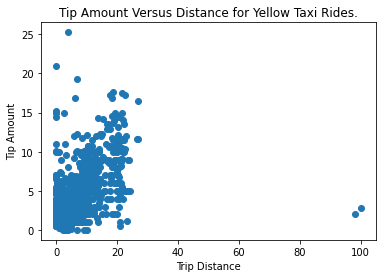

In [71]:
plot_q5(yellow_taxi)

### 6. Create another scatter plot that compares tip amount versus precipitation amount for Yellow Taxi rides. You may remove any outliers how you see fit.

Draw a scatter plot, x-axis = Precipitation and y-axis = Tip amount.

In [68]:
def plot_q6(yellow_taxi,daily_weather):
    new_yellow_taxi = yellow_taxi.sample(10000)
    new_yellow_taxi.iloc[0,-3] = pd.to_datetime("2009-01-15 18:14:31")
    new_yellow_taxi.loc[:,"day"] = [pd.to_datetime(str(x).split(" ")[0]) for x in new_yellow_taxi.loc[:,"pickup_datetime"]]
    def merge(day,daily_weather):
        a = daily_weather[daily_weather["DATES"] == day]
        if len(a) == 0:
            return np.nan
        return a.iloc[0]["DailyPrecipitation"]

    new_yellow_taxi2 = new_yellow_taxi.copy()
    new_yellow_taxi2["HourlyPrecipitation"] = [merge(day,daily_weather) for day in new_yellow_taxi["day"].tolist()]
    new_yellow_taxi2 = new_yellow_taxi2.dropna()
    plt.scatter(new_yellow_taxi2["HourlyPrecipitation"],new_yellow_taxi2["tip_amount"])
    plt.xlabel("Precipitation")
    plt.ylabel("Tip Amount")
    plt.title("Tip Amount Versus Precipitation for Yellow Taxi Rides.")
    plt.show()

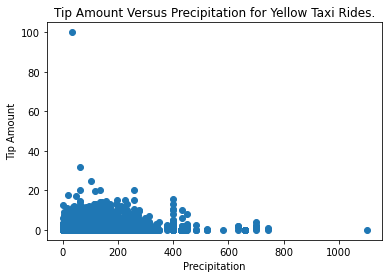

In [69]:
plot_q6(yellow_taxi,daily_weather)

### 7. Come up with 3 questions on your own that can be answered based on the data in the 4 tables. Create at least one visualization to answer each question. At least one visualization should require data from at least 3 tables.

#### Create a scatter plot that compares total amount versus distance for Yellow Taxi rides.

Draw a scatter plot, x-axis = Trip Distance and y-axis = Total Amount.

In [75]:
def plot_q7(yellow_taxi):
    filtered_yellow_taxi = yellow_taxi[["distance","total_amount"]].sample(10000)
    filtered_yellow_taxi = filtered_yellow_taxi.loc[filtered_yellow_taxi["distance"] < 100]
    filtered_yellow_taxi = filtered_yellow_taxi.loc[filtered_yellow_taxi["total_amount"] < 300]
    filtered_yellow_taxi = filtered_yellow_taxi.loc[filtered_yellow_taxi["distance"] < 200]
    filtered_yellow_taxi = filtered_yellow_taxi.loc[filtered_yellow_taxi["total_amount"] > 0]
    plt.scatter(filtered_yellow_taxi["distance"],filtered_yellow_taxi["total_amount"])
    plt.xlabel("Trip Distance")
    plt.ylabel("Total Amount")
    plt.title("Total Amount Versus Distance for Yellow Taxi Rides.")
    plt.show()

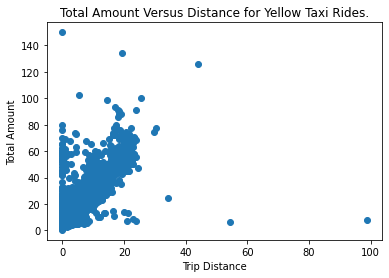

In [76]:
plot_q7(yellow_taxi)

#### Create a scatter plot that compares tip amount versus wind speed for Yellow Taxi rides. 

Draw a scatter plot, x-axis = Wind Speed and y-axis = Tip amount.

In [70]:
def plot_q8(yellow_taxi,daily_weather):
    new_yellow_taxi = yellow_taxi.sample(10000)
    new_yellow_taxi.iloc[0,-3] = pd.to_datetime("2009-01-15 18:14:31")
    #new_yellow_taxi = yellow_taxi.copy()
    new_yellow_taxi.loc[:,"day"] = [pd.to_datetime(str(x).split(" ")[0]) for x in new_yellow_taxi.loc[:,"pickup_datetime"]]
    def merge(day,daily_weather):
        a = daily_weather[daily_weather["DATES"] == day]
        if len(a) == 0:
            return np.nan
        return a.iloc[0]["DailyAverageWindSpeed"]

    #new_yellow_taxi = new_yellow_taxi.copy()
    new_yellow_taxi["DailyAverageWindSpeed"] = [merge(day,daily_weather)    for day in new_yellow_taxi["day"].tolist()]
    new_yellow_taxi = new_yellow_taxi.dropna()
    plt.scatter(new_yellow_taxi["DailyAverageWindSpeed"],new_yellow_taxi["tip_amount"])
    plt.xlabel("Wind Speed")
    plt.ylabel("Tip Amount")
    plt.title("Tip Amount Versus Wind Speed for Yellow Taxi Rides.")
    plt.show()

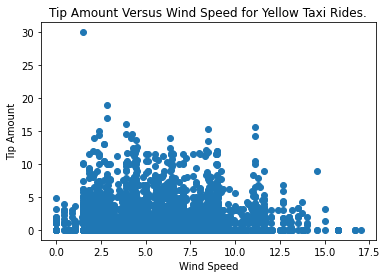

In [71]:
plot_q8(yellow_taxi,daily_weather)

#### Tip Amount Versus Precipitation for Yellow Taxi Rides.

Draw a scatter plot, x-axis = Precipitation and y-axis = Average Cost per Mile.

In [72]:
def plot_q9(yellow_taxi,daily_weather,uber):
    new_yellow_taxi = yellow_taxi.sample(10000)
    new_yellow_taxi.iloc[0,-3] = pd.to_datetime("2009-01-15 18:14:31")
    #new_yellow_taxi = yellow_taxi.copy()
    new_yellow_taxi.loc[:,"day"] = [pd.to_datetime(str(x).split(" ")[0]) for x in new_yellow_taxi.loc[:,"pickup_datetime"]]
    def merge(day,daily_weather):
        a = daily_weather[daily_weather["DATES"] == day]
        if len(a) == 0:
            return np.nan
        return a.iloc[0]["DailyPrecipitation"]
    #print(new_yellow_taxi.columns)
    #new_yellow_taxi2 = new_yellow_taxi.copy()
    new_yellow_taxi["HourlyPrecipitation"] = [merge(day,daily_weather) for day in new_yellow_taxi["day"].tolist()]
    new_yellow_taxi = new_yellow_taxi.dropna()
    #print(len(new_yellow_taxi))
    new_yellow_taxi = new_yellow_taxi.loc[(new_yellow_taxi["total_amount"] / new_yellow_taxi["distance"]) < 500]
    plt.scatter(new_yellow_taxi["HourlyPrecipitation"],new_yellow_taxi["total_amount"] / new_yellow_taxi["distance"],\
               label = "yellow taxi")
    
    
    new_uber = uber.sample(10000)
    #new_uber.iloc[0,-3] = pd.to_datetime("2009-01-15 18:14:31")
    new_uber.loc[:,"day"] = [pd.to_datetime(str(x).split(" ")[0]) for x in new_uber.loc[:,"pickup_datetime"]]
    new_uber["HourlyPrecipitation"] = [merge(day,daily_weather) for day in new_uber["day"].tolist()]
    new_uber = new_uber.dropna()
    new_uber = new_uber.loc[(new_uber["fare_amount"] / new_uber["distance"]) < 500]
    plt.scatter(new_uber["HourlyPrecipitation"],new_uber["fare_amount"] / new_uber["distance"],\
               label = "uber")
    
    plt.xlabel("Precipitation")
    plt.ylabel("Average Cost per Mile")
    plt.title("Tip Amount Versus Precipitation for Yellow Taxi Rides.")
    plt.legend()
    plt.show()

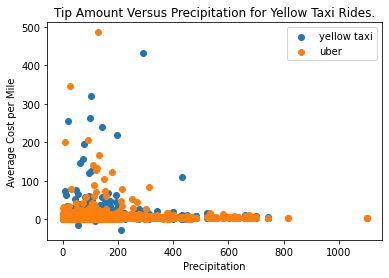

In [73]:
plot_q9(yellow_taxi,daily_weather,uber)